<a href="https://colab.research.google.com/github/kentokura/tictactoe_analysis/blob/main/tictactoe.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TicTacToeの解析

初期盤面から到達可能な全局面を可視化する．手番の対称性より，先手をo(赤), 後手をx(青)と固定する．対称な盤面は同一とみなす．

## TL;DR


後退解析の様子

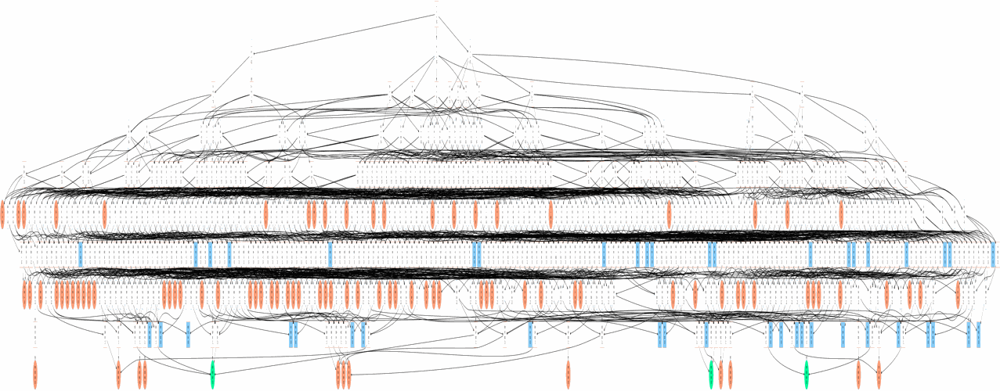

In [ ]:
from IPython.display import Image
Image('./result/tic_tac_toe_retrograde_analysis__resize.gif', format='png')

拡大

ノードの数字は合法手数, 遷移ノード数を表す.

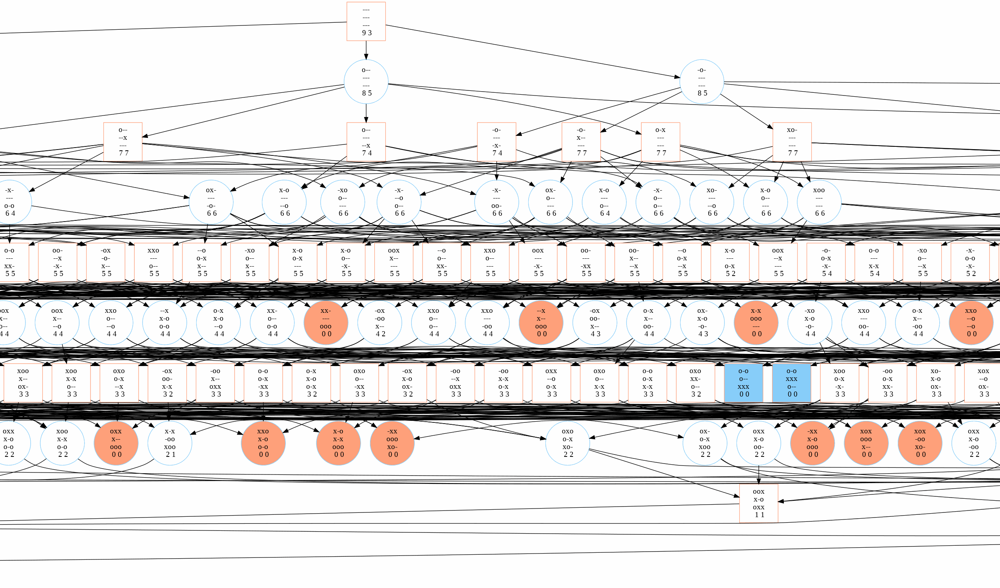

In [ ]:
Image('./result/tic_tac_toe_retrograde_analysis__crop.gif', format='png')

解析結果. 初期盤面は引き分けだとわかる. 
```
後退解析終了. 
後退解析のループ回数 11
実行時間 0:01:04.286593
到達可能な全局面 765
勝ち盤面の数 390 負け盤面の数 224 引き分け盤面の数 151 千日手盤面の数 0
先手勝ち盤面の数 412 先手負け盤面の数 202 引き分け盤面の数 151 千日手盤面の数 0
初期盤面 引き分け
後退解析結果を./resultに保存しました.
```

## ゲームの実装

### 関数

In [ ]:
# 確かめるマスの座標 = [[0,1,2], [3,4,5], [6,7,8], [0,3,6], [1,4,7], [2,5,8], [0,4,8], [2,4,6]]
check_masks = [0b111000000, 0b000111000, 0b000000111, 
                 0b100100100, 0b010010010, 0b001001001, 
                 0b100010001, 0b001010100]
# 8つの変換関数
def horizonal(board):
    return ((board   & 0b_111000000_111000000) >> 6) \
            | ((board & 0b_000111000_000111000)) \
            | ((board & 0b_000000111_000000111) << 6)

def vertical(board):
    return ((board   & 0b_100100100_100100100) >> 2) \
            | (board  & 0b_010010010_010010010) \
            | ((board & 0b_001001001_001001001) << 2)

def rotate90(board):
    return ((board   & 0b_100001000_100001000) >> 2) \
            | ((board & 0b_010000000_010000000) >> 4) \
            | ((board & 0b_001000000_001000000) >> 6) \
            | ((board & 0b_000100001_000100001) << 2) \
            | ( board & 0b_000010000_000010000) \
            | ((board & 0b_000000100_000000100) << 6) \
            | ((board & 0b_000000010_000000010) << 4) 

def rotate180(board):
    board = ( (board & 0b_111100000_111100000) >> 5) \
            |  (board & 0b_000010000_000010000) \
            | ((board & 0b_000001111_000001111) << 5)
    board = ( (board & 0b_110001100_110001100) >> 2) \
            |  (board & 0b_000010000_000010000) \
            | ((board & 0b_001100011_001100011) << 2)
    board = ( (board & 0b_101001010_101001010) >> 1) \
            |  (board & 0b_000010000_000010000) \
            | ((board & 0b_010100101_010100101) << 1)
    return board

def rotate270(board):
    board = rotate180(board)
    board = rotate90(board)
    return board

def line048(board):
    board = vertical(board)
    board = rotate90(board)
    return board

def line246(board):
    board = horizonal(board)
    board = rotate90(board)
    return board
# 正規化
def convert_normalization_board(board):
    # 変換して最も小さい盤面で正規化する
    cand_board = {board, horizonal(board),
                  vertical(board), rotate90(board),
                  rotate180(board), rotate270(board),
                  line048(board), line246(board)}
    board = min(cand_board)
    return board


### stateクラス

In [ ]:
# クラス作成
class State:
    # 初期化
    def __init__(self, board=None):
        self.board = convert_normalization_board(board) if board != None else 0
    # 駒の数
    def bits_count(self, bits):
        count = 0
        while bits:
            count += bits & 1
            bits = bits >> 1
        return count
    # 先手か
    def is_first_player(self):
        return self.bits_count(self.board >> 9) == self.bits_count(self.board & 0b000000000_111111111)
    # 負けか
    def is_lose(self):
        enemy_pieces = self.board & 0b000000000_111111111
        for check_mask in check_masks:
            if (enemy_pieces & check_mask) == check_mask:
                return True
        return False
    # 引き分けか
    def is_draw(self):
        return self.bits_count(self.board) == 9
    # ゲーム終了か
    def is_done(self):
        return self.is_lose() or self.is_draw()
    # 次の状態を作成
    def next(self, action):
      if self.is_done():
        return None
      else:
        board = (self.board >> 9) | ((self.board & 0b000000000_111111111) << 9)
        board = board | action
      return State(board)
    # 合法手一覧
    def legal_actions(self):
        actions = (self.board >> 9) | (self.board & 0b000000000_111111111)
        actions = 0b111111111 & (~actions)
        actions_list = []
        count = 0
        # print("actions = ", bin(actions))
        while actions:
            if actions & 1:
                actions_list.append(2**count)
            actions = actions >> 1
            count += 1
        return actions_list
    # 次のすべての状態を作成
    def all_next(self):
      if self.is_done():
        return []
      else:
        actions = self.legal_actions()
        next_boards = set()
        next_states = []
        for action in actions:
          next_state = self.next(action)
          next_boards.add(next_state.board)
        for board in next_boards:
          next_states.append(State(board))
      return next_states

    # 正規化しないで盤面を表示
    def print_board(self, board):
        my_pieces = board >> 9
        enemy_pieces = board & 0b000000000_111111111
        board_str = ""
        for i in range(9):
            if my_pieces & 1:
                board_str += "M" # me
            elif enemy_pieces & 1:
                board_str += "Y" # you
            else:
                board_str += "-"
            my_pieces = my_pieces >> 1
            enemy_pieces = enemy_pieces >> 1
        output_str = ""
        for i in range(3):
            output_str += f"{board_str[3*i]}{board_str[3*i+1]}{board_str[3*i+2]}"
            output_str += "\n"
        return output_str

    # 正規化しないで行動を表示
    def print_action(self, action):
        board_str = ""
        for i in range(9):
            if action & 1:
                board_str += "M" # me
            else:
                board_str += "-"
            action = action >> 1
        output_str = ""
        for i in range(3):
            output_str += f"{board_str[3*i]}{board_str[3*i+1]}{board_str[3*i+2]}"
            output_str += "\n"
        return output_str
    
    # 自身を表示
    def __str__(self):
        ox = ("o", "x") if self.is_first_player() else ("x", "o")
        my_pieces = self.board >> 9
        enemy_pieces = self.board & 0b000000000_111111111

        board_str = ""
        for i in range(9):
            if my_pieces & 1:
                board_str += ox[0]
            elif enemy_pieces & 1:
                board_str += ox[1]
            else:
                board_str += "-"
            my_pieces = my_pieces >> 1
            enemy_pieces = enemy_pieces >> 1

        output_str = ""
        for i in range(3):
            output_str += f"{board_str[3*i]}{board_str[3*i+1]}{board_str[3*i+2]}"
            output_str += "\n"
        return output_str

テスト

In [ ]:
from IPython.display import clear_output
import time
# 雰囲気出す(結果が見やすいように出力を更新する)
def step(s):
  time.sleep(s) #s秒の休止
  clear_output(wait=True)
  return 0

# 確認開始
print("確認開始")
step(3)
state = State()
print("state", f"{state.board:018b}")
print(state)
step(1)
actions = state.legal_actions()
for action in actions:
  print("action", f"{action:09b}")
  print(state.print_action(action))
  step(1)
print("num of action", len(actions))
step(2)
for next_state in state.all_next():
  print("next state", f"{next_state.board:018b}")
  print(next_state)
  step(1)
print("num of next state", len(state.all_next()))
step(3)

print("確認終了")

確認終了


## 全探索

手番をノードの縁の色で表す． 勝敗がついたら，ノードを勝ったプレイヤの色にする．引き分けは緑．見やすさのため，矢印は描画しない．



In [ ]:
from graphviz import Digraph
from collections import deque

In [ ]:
# %%time

G = Digraph(format='png')

state = State()
q = deque()
q.append(state.board)
all_states = [] # 解析用
all_next_states = [] # 解析用
all_winorlose = [] # 解析用
# for i in range(100): # テスト
while len(q):
  state = State(q.popleft())
  next_states = state.all_next()
  # ノードの設定ここから
  is_lose = state.is_lose()
  is_draw = state.is_draw()
  is_first_player = state.is_first_player()
  num_of_legal_action = len(state.legal_actions())
  num_of_next_state = len(next_states)
  if state.is_done():
    num_of_legal_action = 0
    num_of_next_state = 0
  label = f"{state} {num_of_legal_action} {num_of_next_state}"
  color = 'LightSalmon' if is_first_player else 'LightSkyBlue'
  fillcolor = "white"
  if is_lose:
    if color == 'LightSalmon': # 赤のターンで負けなら、青の勝ち
      fillcolor = "LightSkyBlue"  
    else: #if color = 'LightSkyBlue': # 青のターンで負けなら、赤の勝ち
      fillcolor = "LightSalmon" 
  elif is_draw:
    fillcolor = "mediumspringgreen"  # 引き分けかどうか
  shape = "square" if is_first_player else "circle" # ノードの形
  margin = "0.1" if is_first_player else "0"
  # ノードの設定ここまで
  G.node(f"{state.board}", label=label, style="filled", color=color, fillcolor=fillcolor, shape=shape, margin=margin)
  all_states.append(state.board) # 解析用に保存
  next_states_list = []
  for next_state in next_states:
    G.edge(f"{state.board}",f"{next_state.board}")
    next_states_list.append(next_state.board)
    if next_state.board not in q:
      q.append(next_state.board)
  all_next_states.append(next_states_list) # 解析用に保存

In [ ]:
%%time
# 書き出し
G.render(f'./result/tic_tac_toe_all_states')

CPU times: user 0 ns, sys: 4.95 ms, total: 4.95 ms
Wall time: 4.42 s


'./result/tic_tac_toe_all_states.png'

## 後退解析

すべてのノードの勝敗を記録するall_winorloseを作成．勝敗確定ノードの勝敗を記録する．未確定はNone, その盤面が勝ち盤面なら1, 負け盤面なら-1, あいこなら0.最初は負け盤面と引き分け盤面しかない．

### 説明用

#### 初回

In [ ]:
Nones = [None] * len(all_states)
all_winorlose = dict(zip(all_states, Nones))
all_next_states_dict = dict(zip(all_states, all_next_states))

In [ ]:
%%time

# all_states = [] # 解析用
# all_next_states = [] # 解析用
Nones = [None] * len(all_states)
all_winorlose = dict(zip(all_states, Nones))

for board in all_states:
  state = State(board)
  if state.is_lose():
    all_winorlose[board] = -1
  elif state.is_done():
    all_winorlose[board] = 0

    

CPU times: user 8.82 ms, sys: 0 ns, total: 8.82 ms
Wall time: 8.88 ms


In [ ]:
# 勝敗の更新

G_analysis = Digraph(format='png')

state = State()
q = deque()
q.append(state.board)
# for i in range(100): # テスト
while len(q):
  state = State(q.popleft())
  next_states = state.all_next()
  # ノードの設定ここから
  board = state.board
  is_lose = state.is_lose()
  is_draw = state.is_draw()
  is_first_player = state.is_first_player()
  num_of_legal_action = len(state.legal_actions())
  num_of_next_state = len(next_states)
  if state.is_done():
    num_of_legal_action = 0
    num_of_next_state = 0
  label = f"{state} {num_of_legal_action} {num_of_next_state}"
  color = 'LightSalmon' if is_first_player else 'LightSkyBlue'
  fillcolor = "white"
  if all_winorlose[board] != None:
    if all_winorlose[board] == 1: # 勝ち
      fillcolor = color
    elif all_winorlose[board] == -1: # 負け
      fillcolor = 'LightSkyBlue' if color == 'LightSalmon' else 'LightSalmon'
    elif all_winorlose[board] == 0: # 引き分け
      fillcolor = "mediumspringgreen"
  shape = "square" if is_first_player else "circle" # ノードの形
  margin = "0.1" if is_first_player else "0"
  # ノードの設定ここまで
  G_analysis.node(f"{state.board}", label=label, style="filled", color = color, fillcolor=fillcolor, shape=shape, margin=margin)
  for next_state in next_states:
    G_analysis.edge(f"{state.board}",f"{next_state.board}", style="invis")
    if next_state.board not in q:
      q.append(next_state.board)

In [ ]:
G_analysis.render('./result/G_analysis0')

'./result/G_analysis0.png'

#### winorloseの更新がなくなるまで後退解析を繰り返す

説明用. 理解できたら[一気に後退解析をするコード](#一気に後退解析をするコード)でよい.

In [ ]:
count_num = 0 # これ以降，下記コードを繰り返す

In [ ]:
# winorloseの更新
count_num = 1

for key, value in all_winorlose.items():
  if value == None:
    for next_state in all_next_states_dict[key]:
      new_winorlose = []
      flag = False
      next_winorlose = all_winorlose[next_state]
      if next_winorlose == None:
        flag = True
        continue;
      elif next_winorlose == -1:
        new_winorlose.append(1)
      elif next_winorlose == 0:
        new_winorlose.append(0)
      elif next_winorlose == 1:
        new_winorlose.append(-1)
    if flag:
      pass;
    else:
      new_winorlose = max(new_winorlose)
      all_winorlose[key] = new_winorlose

In [ ]:
# グラフの更新

G_analysis = Digraph(format='png')

state = State()
q = deque()
q.append(state.board)
# for i in range(100): # テスト
while len(q):
  state = State(q.popleft())
  next_states = state.all_next()
  # ノードの設定ここから
  board = state.board
  is_lose = state.is_lose()
  is_draw = state.is_draw()
  is_first_player = state.is_first_player()
  num_of_legal_action = len(state.legal_actions())
  num_of_next_state = len(next_states)
  if state.is_done():
    num_of_legal_action = 0
    num_of_next_state = 0
  label = f"{state} {num_of_legal_action} {num_of_next_state}"
  color = 'LightSalmon' if is_first_player else 'LightSkyBlue'
  fillcolor = "white"
  if all_winorlose[board] != None:
    if all_winorlose[board] == 1: # 勝ち
      fillcolor = color
    elif all_winorlose[board] == -1: # 負け
      fillcolor = 'LightSkyBlue' if color == 'LightSalmon' else 'LightSalmon'
    elif all_winorlose[board] == 0: # 引き分け
      fillcolor = "mediumspringgreen"
  shape = "square" if is_first_player else "circle" # ノードの形
  margin = "0.1" if is_first_player else "0"
  # ノードの設定ここまで
  G_analysis.node(f"{state.board}", label=label, style="filled", color = color, fillcolor=fillcolor, shape=shape, margin=margin)
  for next_state in next_states:
    G_analysis.edge(f"{state.board}",f"{next_state.board}", style="invis")
    if next_state.board not in q:
      q.append(next_state.board)

In [ ]:
G_analysis.render(f'./result/G_analysis{count_num}')

'./result/G_analysis1.png'

### 一気に後退解析をするコード

先に[全探索とグラフの作成](#scrollTo=1ca3FqN1mT9z&line=1&uniqifier=1)で全探索をしてall_states, all_next_statesを作成しておいてください．

In [ ]:
from tqdm.notebook import tqdm as tqdm
import datetime

In [ ]:
Nones = [None] * len(all_states)
all_winorlose = dict(zip(all_states, Nones))
all_next_states_dict = dict(zip(all_states, all_next_states))

In [ ]:
now = datetime.datetime.now() # 実行時間

# 勝敗確定ノードの勝敗を保存する
for board in tqdm(all_states, desc="勝敗確定ノードの勝敗を保存", leave=True):
  state = State(board)
  if state.is_lose():
    all_winorlose[board] = -1
  elif state.is_done():
    all_winorlose[board] = 0

count_num = 0 # 解析のループ回数

# winorloseの更新
update_flag = True
while update_flag:
  update_flag = False
  count_num += 1
  # すべてのノードを確認
  for key, value in tqdm(all_winorlose.items(), desc=f"{count_num}回目の後退解析", leave=True):
    if value == None:
      new_winorlose = []
      for next_state in all_next_states_dict[key]: # すべての次の状態の価値を確認
        next_value = None if all_winorlose[next_state] == None else -(all_winorlose[next_state]) # 価値は反転
        new_winorlose.append(next_value)
      if 1 in new_winorlose: # 勝ちがあるなら
        update_flag = True
        all_winorlose[key] = 1
      elif None in new_winorlose: # 未確定があるなら
        pass;
      elif 0 in new_winorlose: # 引き分け
        update_flag = True
        all_winorlose[key] = 0
      elif -1 in new_winorlose: # 負け
        update_flag = True
        all_winorlose[key] = -1
      else : # ここにはこない
        print("ほげーーー")

  # グラフの更新
  G_analysis = Digraph(format='png')
  state = State()
  q = deque()
  q.append(state.board)
  # for i in range(100): # テスト
  while len(q):
    state = State(q.popleft())
    next_states = state.all_next()
    # ノードの設定ここから
    board = state.board
    is_lose = state.is_lose()
    is_draw = state.is_draw()
    is_first_player = state.is_first_player()
    num_of_legal_action = len(state.legal_actions())
    num_of_next_state = len(next_states)
    if state.is_done():
      num_of_legal_action = 0
      num_of_next_state = 0
    label = f"{state} {num_of_legal_action} {num_of_next_state}"
    color = 'LightSalmon' if is_first_player else 'LightSkyBlue'
    fillcolor = "white"
    if all_winorlose[board] != None:
      if all_winorlose[board] == 1: # 勝ち
        fillcolor = color
      elif all_winorlose[board] == -1: # 負け
        fillcolor = 'LightSkyBlue' if color == 'LightSalmon' else 'LightSalmon'
      elif all_winorlose[board] == 0: # 引き分け
        fillcolor = "mediumspringgreen"
    shape = "square" if is_first_player else "circle" # ノードの形
    margin = "0.1" if is_first_player else "0"
    # ノードの設定ここまで
    G_analysis.node(f"{state.board}", label=label, style="filled", color = color, fillcolor=fillcolor, shape=shape, margin=margin)
    for next_state in next_states:
      if fillcolor == "white":
        G_analysis.edge(f"{state.board}",f"{next_state.board}")#, style="invis")
      else:
        G_analysis.edge(f"{state.board}",f"{next_state.board}", style="invis")
      if next_state.board not in q:
        q.append(next_state.board)

  # グラフの保存
  G_analysis.render(f'./result/tic_tac_toe_retrograde_analysis_{count_num}')


### 結果の解析

#### 解析結果

In [ ]:
%%time

# 結果の解析
# 成果物... all_winorlose 勝ち負け引き分けをつけた.Noneはサイクル(千日手).
old_now = now
now = datetime.datetime.now()
win_state = [k for k, v in all_winorlose.items() if v ==1]
lose_state = [k for k, v in all_winorlose.items() if v ==-1]
draw_state = [k for k, v in all_winorlose.items() if v ==0]
cycle_state = [k for k, v in all_winorlose.items() if v ==None]
first_win_state = []
first_lose_state = []
for k, v in all_winorlose.items():
  if v == 1:
    # 勝ったプレイヤーに応じて抽出
    state = State(k)
    if state.is_first_player():
      first_win_state.append(state.board)
    else: # state.is_first_player() != 1:
      first_lose_state.append(state.board)
  elif v == -1:
    # 負けたプレイヤーに応じて抽出
    state = State(k)
    if state.is_first_player():
      first_lose_state.append(state.board)
    else: # state.is_first_player() != 1:
      first_win_state.append(state.board)

init_value = "未確定" # ゲームの解決
if 0 in first_win_state:
  init_value = "先手勝ち"  
elif 0 in first_lose_state:
  init_value = "後手勝ち"  
elif 0 in draw_state: 
  init_value = "引き分け"  

# 出力
clear_output(wait=True)
print("後退解析終了. ")
print("後退解析のループ回数", count_num)
print("実行時間", now - old_now)
print("到達可能な全局面", len(all_states))
print("勝ち盤面の数", len(win_state), "負け盤面の数", len(lose_state),
      "引き分け盤面の数", len(draw_state), "千日手盤面の数", len(cycle_state) )
print("先手勝ち盤面の数", len(first_win_state), "先手負け盤面の数", len(first_lose_state),
       "引き分け盤面の数", len(draw_state), "千日手盤面の数", len(cycle_state) )
print("初期盤面", init_value)
print("後退解析結果を./resultに保存しました.")

後退解析終了. 
後退解析のループ回数 10
実行時間 0:00:42.248534
到達可能な全局面 765
勝ち盤面の数 390 負け盤面の数 224 引き分け盤面の数 151 千日手盤面の数 0
先手勝ち盤面の数 412 先手負け盤面の数 202 引き分け盤面の数 151 千日手盤面の数 0
初期盤面 引き分け
後退解析結果を./resultに保存しました.
CPU times: user 9.89 ms, sys: 978 µs, total: 10.9 ms
Wall time: 9.55 ms


#### 確認用

In [ ]:
# 先手勝ちの盤面を目視
print("確認開始")
step(3)
for state in first_win_state:
  state = State(state)
  print("first_win_state", f"{state.board:018b}")
  print(state)
  step(1)

print("num of first win state", len(first_win_state))
step(3)
print("終了")

終了


In [ ]:
# 後手勝ちの盤面を目視
print("確認開始")
step(3)
for state in first_lose_state:
  state = State(state)
  print("first_lose_state", f"{state.board:018b}")
  print(state)
  step(1)

print("num of first lose state", len(first_lose_state))
step(3)
print("終了")

終了


## GIFアニメーションの作成

In [ ]:
#ver. resize
from PIL import Image

# 全探索結果(all_states)と、後退解析(retro_analysis)を結合

file_name = './result/tic_tac_toe_all_states' + '.png'
all_states_img = Image.open(file_name)
width = all_states_img.width // 20
height = all_states_img.height // 3
all_states_img = all_states_img.resize((width, height))

r_analysis_imgs = []
for i in range(count_num):
    file_name = f'./result/tic_tac_toe_retrograde_analysis_{i+1}.png'
    im = Image.open(file_name)
    im = im.resize((width, height))
    r_analysis_imgs.append(im)
all_states_img.save('./result/tic_tac_toe_retrograde_analysis__resize.gif', save_all=True, append_images=r_analysis_imgs, loop=0, duration=1000)


In [ ]:
#ver. crop
from PIL import Image

# 全探索結果(all_states)と、後退解析(retro_analysis)を結合

file_name = './result/tic_tac_toe_all_states' + '.png'
all_states_img = Image.open(file_name)
width = all_states_img.width // 20
height = all_states_img.height
x1, y1 = (all_states_img.width // 2 - width - width , 0)
x2, y2 = (all_states_img.width // 2   , height)
all_states_img = all_states_img.crop((x1, y1, x2, y2))
#  im.crop((all_states_img.width // 4, 0, (all_states_img.width // 4) * 3, all_states_img))

r_analysis_imgs = []
for i in range(count_num):
    file_name = f'./result/tic_tac_toe_retrograde_analysis_{i+1}.png'
    im = Image.open(file_name)
    im = im.crop((x1, y1, x2, y2))
    r_analysis_imgs.append(im)
all_states_img.save('./result/tic_tac_toe_retrograde_analysis__crop.gif', save_all=True, append_images=r_analysis_imgs, loop=0, duration=1000)
